<a href="https://colab.research.google.com/github/ranjeetai/AI/blob/main/jupyter_notebooks/Video_data_processing_cv2_ffmpeg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Setting Up Your Python Environment for Video Processing 🛠️

Before we get our hands dirty with code, let’s make sure your Python environment is ready for video processing. We’ll be leveraging several powerful libraries:

- **OpenCV (`cv2`):** Used for reading, processing, and manipulating video data. (Install with `pip install opencv-python`)
- **Matplotlib:** Ideal for plotting and visualizing video frames. (Install with `pip install matplotlib`)
- **FFmpeg:** A robust tool for converting video formats. Learn more on [ffmpeg.org](https://ffmpeg.org/ffmpeg.html).

In addition, we use:
- **Pandas and NumPy:** For data manipulation.
- **IPython.display:** To display videos directly in Jupyter Notebooks.
- **Tqdm:** To add progress bars to loops, which is especially useful when processing long videos.

Here’s a snippet to import these libraries and set up your environment:

In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from glob import glob
import IPython.display as ipd
from tqdm import tqdm
import subprocess

plt.style.use('ggplot')

print('Environment is set up!')

Environment is set up!


In [2]:
! pip install -q kaggle



In [3]:
from google.colab import userdata
import os

os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

In [4]:
# kaggle datasets download robikscube/driving-video-with-object-tracking

In [6]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("robikscube/driving-video-with-object-tracking")

print("Path to dataset files:", path)

Resuming download from 8280604672 bytes (11661666533 bytes left)...
Resuming download from https://www.kaggle.com/api/v1/datasets/download/robikscube/driving-video-with-object-tracking?dataset_version_number=1 (8280604672/19942271205) bytes left.


100%|██████████| 18.6G/18.6G [08:10<00:00, 23.8MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/robikscube/driving-video-with-object-tracking/versions/1


In [7]:
import shutil
import os

source_path = "/root/.cache/kagglehub/datasets/robikscube/driving-video-with-object-tracking/versions/1"
destination_path = "/content/driving-video-with-object-tracking"  # You can change the destination folder name

# Create the destination directory if it doesn't exist
os.makedirs(destination_path, exist_ok=True)

# Move the data
shutil.move(source_path, destination_path)

print(f"Data moved to: {destination_path}")

Data moved to: /content/driving-video-with-object-tracking


In [ ]:
path

In [ ]:
# ! unzip "driving-video-with-object-tracking.zip"

## Converting Video Types with FFmpeg 🎬

Different video formats exist for various purposes. Sometimes, you might have a `.mov` file that you’d like to convert to `.mp4`—a more widely supported format. FFmpeg is your go‑to tool for this task. Here’s how you can use it within Python:

In [8]:
input_file = '/content/driving-video-with-object-tracking/1/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov'
subprocess.run([
    'ffmpeg', '-i', input_file, '-qscale', '0',
    '026c7465-309f6d33.mp4', '-loglevel', 'quiet'
])

print('Conversion complete!')

Conversion complete!


## Displaying Video in a Jupyter Notebook 📺

With `IPython.display`, you can seamlessly embed videos directly in your notebook. For example:

In [ ]:
ipd.display(ipd.Video('/content/026c7465-309f6d33.mp4', width=700, embed=True))

## Reading Video Metadata with OpenCV 📊

Understanding a video’s metadata is key to efficient processing. OpenCV allows you to extract important details such as total frame count, resolution, and frame rate. Let’s look at an example:

In [11]:
# Open the video file
cap = cv2.VideoCapture('/content/026c7465-309f6d33.mp4')

# Total number of frames
total_frames = cap.get(cv2.CAP_PROP_FRAME_COUNT)
print(f'Total Frames: {total_frames}')

# Video resolution (height and width)
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height: {height}, Width: {width}')

channel = cap.get(cv2.CAP_PROP_FRAME_TYPE)
print(f'Channels: {channel}')

# Frames per second (fps)
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS: {fps:0.2f}')
cap.release()

Total Frames: 2398.0
Height: 720.0, Width: 1280.0
Channels: 63.0
FPS: 59.94


In [12]:
from google.colab.patches import cv2_imshow
cap = cv2.VideoCapture('/content/026c7465-309f6d33.mp4')
ret, frame = cap.read()
print(int(cap.get(cv2.CAP_PROP_FRAME_COUNT)))
# for i in range(int(cap.get(cv2.CAP_PROP_FRAME_COUNT))):
#   ret, frame = cap.read()
#   # cv2_imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY))
# # cv2_imshow(video)
print(f'Returned {ret} and image shape: {frame.shape}')
cap.release()

2398
Returned True and image shape: (720, 1280, 3)


## Extracting and Displaying Video Frames 🖼️

### Extracting a Single Frame

The following code extracts a single frame from the video and prints its shape:

In [21]:
cap.release()

In [24]:
cap = cv2.VideoCapture('/content/026c7465-309f6d33.mp4')
ret, frame = cap.read()
# print(f'Returned {ret} and image shape: {frame.shape}')
cap.release()

In [25]:
frame.shape

(720, 1280, 3)

### Displaying a Frame

To display the frame in a notebook, convert the image from BGR (OpenCV’s default) to RGB (the format used by matplotlib):

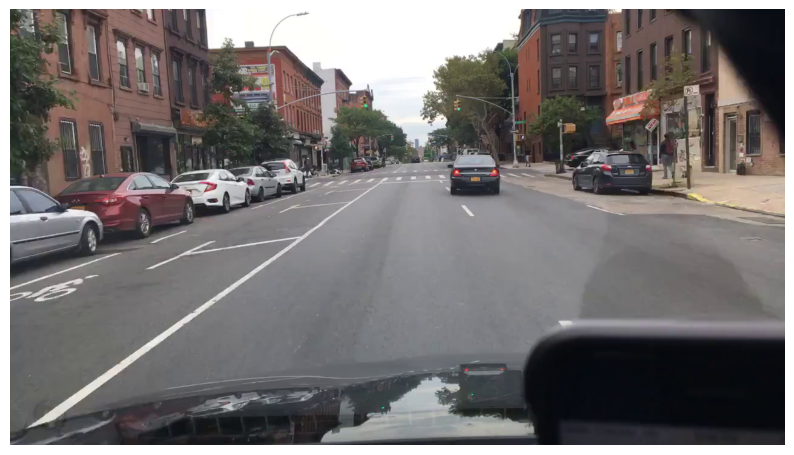

In [26]:
def display_cv2_img(img, figsize=(10, 10)):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_rgb)
    ax.axis('off')

display_cv2_img(frame)

## Displaying Multiple Frames 🚀

The following example shows how to sample and display every 100th frame from the video in a grid layout:

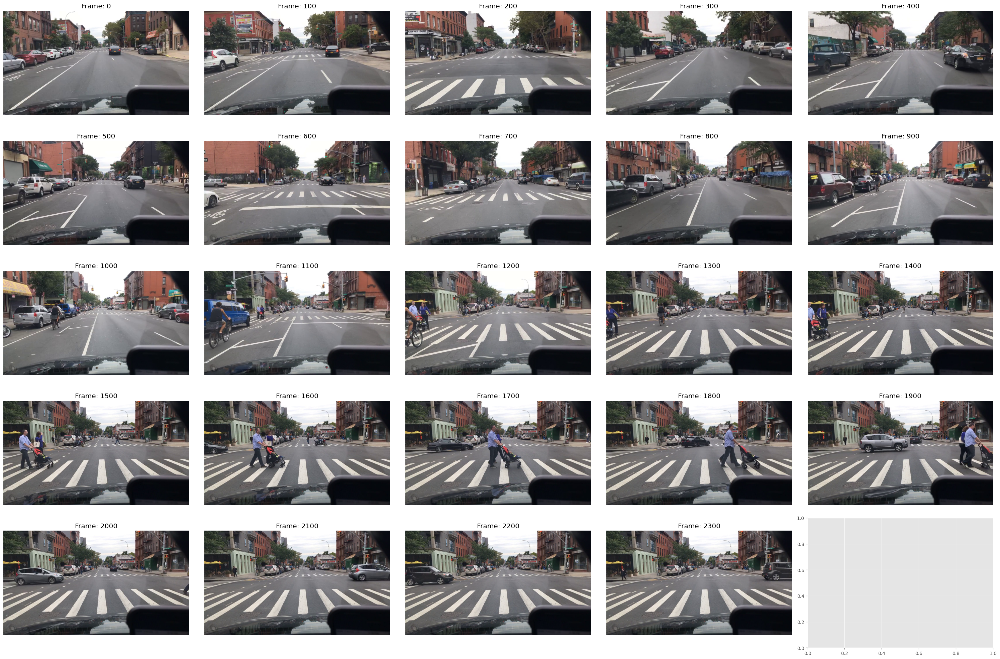

In [27]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
img_idx = 0

for frame in range(n_frames):
    ret, img = cap.read()
    if not ret:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

## Annotating Video Frames with Object Labels 🔍

For many real-world applications such as autonomous driving, it is important to annotate video frames with labels from an object detection model. In this example, we assume you have a CSV file with annotations. First, load the labels and filter them for a specific video.

In [29]:
labels = pd.read_csv('/content/driving-video-with-object-tracking/1/mot_labels.csv', low_memory=False)
video_labels = labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")
print(video_labels["category"].value_counts())

category
car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: count, dtype: int64


In [35]:
len(video_labels)

5171

In [36]:
cap = cv2.VideoCapture("/content/026c7465-309f6d33.mp4")
cap.get(cv2.CAP_PROP_FRAME_COUNT)

2398.0

### Annotating a Specific Frame (Frame 1035)

The following code extracts frame 1035 from the video and displays it with bounding boxes drawn around each detected object.

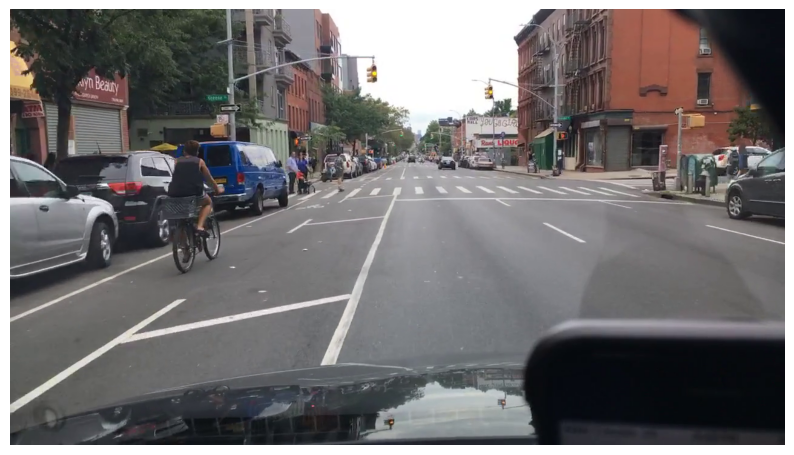

In [51]:
cap = cv2.VideoCapture('/content/026c7465-309f6d33.mp4')
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in range(n_frames):
    ret, img = cap.read()
    if not ret:
        break
    if frame == 1035:
        break
cap.release()
display_cv2_img(img)

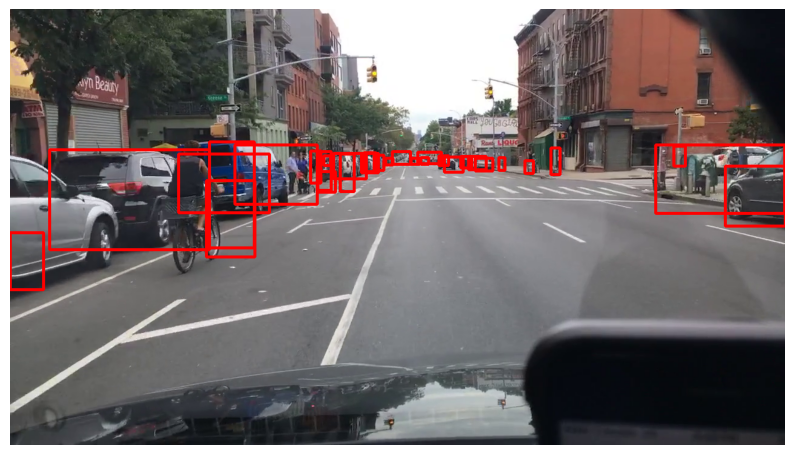

In [52]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1000')
for i, d in frame_labels.iterrows():
    pt1 = (int(d['box2d.x1']), int(d['box2d.y1']))
    pt2 = (int(d['box2d.x2']), int(d['box2d.y2']))
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)
display_cv2_img(img_example)

### Color‑Coded Annotations

To differentiate between object types, assign each category a unique color:

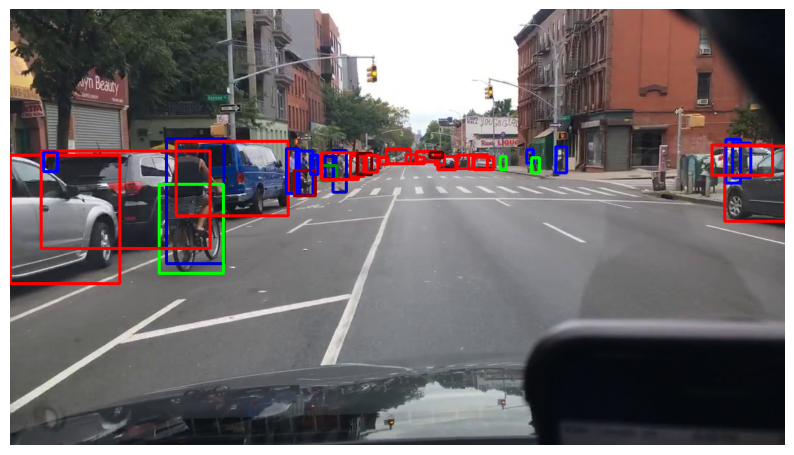

In [53]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = (int(d['box2d.x1']), int(d['box2d.y1']))
    pt2 = (int(d['box2d.x2']), int(d['box2d.y2']))
    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 3)
display_cv2_img(img_example)

### Adding Text Annotations to Video Frames

To further enhance clarity, add text labels to each bounding box that identify the object category:

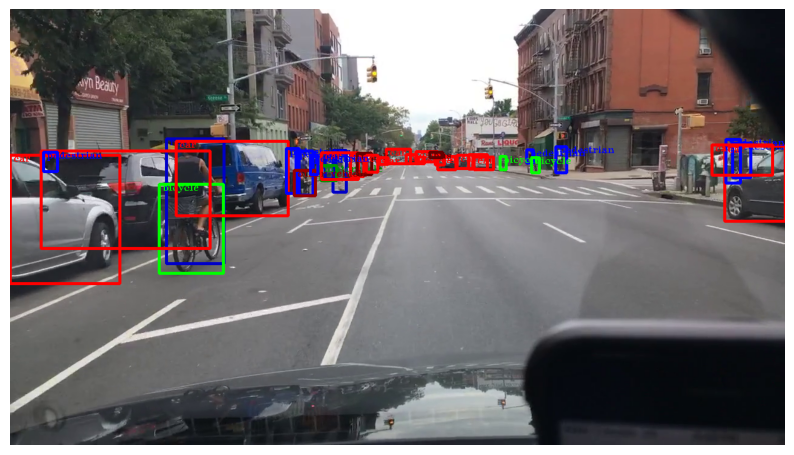

In [54]:
frame_labels = video_labels.query("video_frame == 1035")
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = (int(d["box2d.x1"]), int(d["box2d.y1"]))
    pt2 = (int(d["box2d.x2"]), int(d["box2d.y2"]))
    color = color_map[d["category"]]
    cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = (int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10))
    cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)
display_cv2_img(img_example)

## Creating a Fully Annotated Video Output 🎞️

Once you’re comfortable annotating individual frames, you can generate a completely annotated video. This process involves reading each frame, overlaying annotations, and writing the modified frame to a new video file.

### Step 1: Define an Annotation Function

In [59]:
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = (int(d["box2d.x1"]), int(d["box2d.y1"]))
        pt2 = (int(d["box2d.x2"]), int(d["box2d.y2"]))
        color = color_map[d["category"]]
        cv2.rectangle(img, pt1, pt2, color, 3)
    return img

print('Annotation function defined!')

Annotation function defined!


### Step 2: Initialize VideoWriter

In [60]:
VIDEO_CODEC = "mp4v"
fps = 59.94
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                      cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                      fps, (width, height))

print('VideoWriter initialized!')

VideoWriter initialized!


### Step 3: Process Each Frame and Write Output

Loop through every frame, annotate it, and write the annotated frame to the new video file:

In [61]:
cap = cv2.VideoCapture("/content/026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if not ret:
        break
    img = add_annotations(img, frame, video_labels)
    out.write(img)
out.release()
cap.release()

print('Annotated video created!')

100%|██████████| 2398/2398 [00:41<00:00, 58.20it/s]

Annotated video created!


### Step 4: Compress and Display the Annotated Video

Use FFmpeg to compress the output and then display it:

In [ ]:
tmp_output_path = "/content/out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run([
    "ffmpeg", "-i", tmp_output_path,
    "-crf", "18", "-preset", "veryfast",
    "-vcodec", "libx264", output_path,
    '-loglevel', 'quiet'
])



In [ ]:
ipd.display(ipd.Video('/content/out_test_compressed.mp4', width=600, embed=True))

print('Annotated video is ready to view!')

## Motion Detection and Object Segmentation 🚗💨

Beyond static annotations, detecting motion within video frames opens up a world of dynamic applications—from tracking vehicles on busy roads to identifying unusual movements in surveillance footage.

### Capturing Consecutive Frames

To detect motion, capture two consecutive frames and compute the difference between them:

In [70]:
cap = cv2.VideoCapture('/content/driving-video-with-object-tracking/1/bdd100k_videos_train_00/bdd100k/videos/train/0001542f-5ce3cf52.mov')
if not cap.isOpened():
    print("Error reading file")

ret, fFrame1 = cap.read()
ret, fFrame2 = cap.read()

img1 = fFrame1.copy()
img2 = fFrame2.copy()

cap.release()
print('Captured two consecutive frames for motion detection.')

Captured two consecutive frames for motion detection.


### Converting to Grayscale and Applying Gaussian Blur

Convert the frames to grayscale for faster processing and apply Gaussian Blur to reduce noise:

In [71]:
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

img1 = cv2.GaussianBlur(img1, (5, 5), 0)
img2 = cv2.GaussianBlur(img2, (5, 5), 0)

print('Converted to grayscale and applied Gaussian Blur.')

Converted to grayscale and applied Gaussian Blur.


### Detecting Motion with Frame Differencing

Calculate the absolute difference between the two frames and apply thresholding to highlight movement:

In [72]:
imgDiff = cv2.absdiff(img1, img2)
ret, imgThresh = cv2.threshold(imgDiff, 30.0, 255.0, cv2.THRESH_BINARY)
print('Computed frame difference and applied threshold.')

Computed frame difference and applied threshold.


### Preprocessing with Dilation and Erosion

Perform dilation followed by erosion to refine the binary image and fill in gaps:

In [73]:
strucEle5x5 = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
for i in range(2):
    imgThresh = cv2.dilate(imgThresh, strucEle5x5, iterations=2)
    imgThresh = cv2.erode(imgThresh, strucEle5x5, iterations=1)

print('Applied dilation and erosion.')

Applied dilation and erosion.


### Extracting and Visualizing Contours

Extract contours from the binary image to detect moving objects and visualize them:

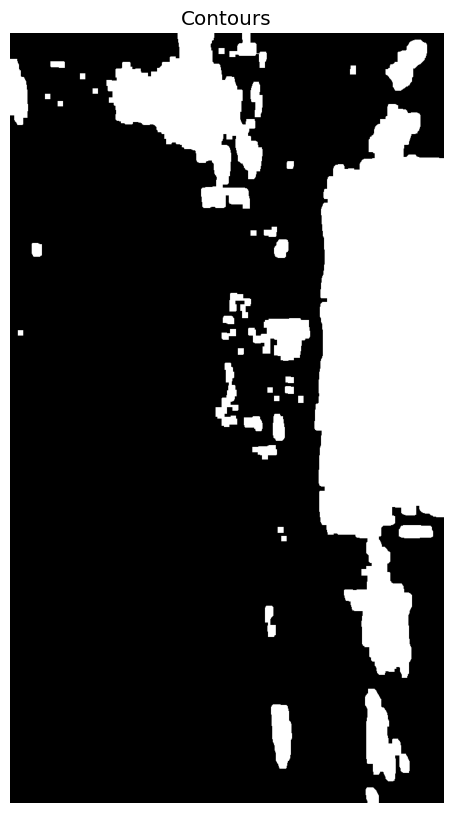

Contours visualized.


In [75]:
contours, hierarchy = cv2.findContours(imgThresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

def drawAndShowContours(wd, ht, contours, strImgName):
    blank_image = np.zeros((ht, wd, 3), np.uint8)
    cv2.drawContours(blank_image, contours, -1, (255, 255, 255), -1)
    plt.figure(figsize=(10, 10))
    plt.imshow(blank_image, cmap='gray')
    plt.title("Contours")
    plt.axis("off")
    plt.show()
    return blank_image

wd = np.size(imgThresh, 1)
ht = np.size(imgThresh, 0)
drawAndShowContours(wd, ht, contours, 'imgContours')

print('Contours visualized.')